In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import warnings
from matplotlib.collections import LineCollection
plt.rcParams['figure.figsize'] = (18, 8)
plt.rcParams['figure.dpi'] = 350
from scipy.stats import norm

In [2]:
def colored_line(x, y, c, ax, **lc_kwargs):
    """
    Plot a line with a color specified along the line by a third value.

    It does this by creating a collection of line segments. Each line segment is
    made up of two straight lines each connecting the current (x, y) point to the
    midpoints of the lines connecting the current point with its two neighbors.
    This creates a smooth line with no gaps between the line segments.

    Parameters
    ----------
    x, y : array-like
        The horizontal and vertical coordinates of the data points.
    c : array-like
        The color values, which should be the same size as x and y.
    ax : Axes
        Axis object on which to plot the colored line.
    **lc_kwargs
        Any additional arguments to pass to matplotlib.collections.LineCollection
        constructor. This should not include the array keyword argument because
        that is set to the color argument. If provided, it will be overridden.

    Returns
    -------
    matplotlib.collections.LineCollection
        The generated line collection representing the colored line.
    """
    if "array" in lc_kwargs:
        warnings.warn('The provided "array" keyword argument will be overridden')

    # Default the capstyle to butt so that the line segments smoothly line up
    default_kwargs = {"capstyle": "butt"}
    default_kwargs.update(lc_kwargs)

    # Compute the midpoints of the line segments. Include the first and last points
    # twice so we don't need any special syntax later to handle them.
    x = np.asarray(x)
    y = np.asarray(y)
    x_midpts = np.hstack((x[0], 0.5 * (x[1:] + x[:-1]), x[-1]))
    y_midpts = np.hstack((y[0], 0.5 * (y[1:] + y[:-1]), y[-1]))

    # Determine the start, middle, and end coordinate pair of each line segment.
    # Use the reshape to add an extra dimension so each pair of points is in its
    # own list. Then concatenate them to create:
    # [
    #   [(x1_start, y1_start), (x1_mid, y1_mid), (x1_end, y1_end)],
    #   [(x2_start, y2_start), (x2_mid, y2_mid), (x2_end, y2_end)],
    #   ...
    # ]
    coord_start = np.column_stack((x_midpts[:-1], y_midpts[:-1]))[:, np.newaxis, :]
    coord_mid = np.column_stack((x, y))[:, np.newaxis, :]
    coord_end = np.column_stack((x_midpts[1:], y_midpts[1:]))[:, np.newaxis, :]
    segments = np.concatenate((coord_start, coord_mid, coord_end), axis=1)

    lc = LineCollection(segments, **default_kwargs)
    lc.set_array(c)  # set the colors of each segment

    return ax.add_collection(lc)

In [28]:
def base_model(x0=np.array([0.5, 0.5]), gamma=np.array([0.5, 0.5]), c=np.array([2*np.pi / 365, 2*np.pi / 365]), 
               d=np.array([2*np.pi / 7, 2*np.pi / 7]), amp=np.array([0, 0]), week_amp=np.array([0, 0]), 
               t0=0, days_adjust=90, num_years=1, plot=True, plot_avg_lines=True, plot_event_lines=True):
    '''Return the approximated solution to the two-person relationship model under the following assumptions:
        1. The personal happiness of each individual is either constant or periodic.
        2. The level of reactivity of each individual is measured by a constant.
        
        Parameters:
            x0 ((1,2) ndarray) : the initial conditions, i.e. starting happiness values for each person
                - defaults to 0.5 for both people
            gamma ((1,2) array-like) : the reactivity coefficients for persons 1 and 2, respectively
                - defaults to 0.5 for both people
            c ((1, 2) array-like) : the period of individual happiness fluctuation for each person 
                - defaults to 2*np.pi / 365 (happiness fluctuates seasonally)
            amp ((1, 2) array-like) : dictates the amplitude of each person's individual happiness wave
                - defaults to (0, 0) (corresponding to constant invidiual happiness)
            d ((1, 2) array-like) : the period of individual happiness fluctuation for each person 
                        on a small-scale basis
                - defaults to 2*np.pi / 365 (happiness fluctuates seasonally)
            week_amp ((1, 2) array-like) : dictates the amplitude of each person's individual happiness 
                        wave on a small-scale basis
                - defaults to (0, 0) (corresponding to constant invidiual happiness)
            t0 (float) : the time at which persons 1 and 2 begin interacting 
                - defaults to 0 (always in relationship)
            days_adjust (int) : the number of days for both people to adjust to relationship, 
                        i.e. reach full interactivity
                - defaults to 90
            num_years (float) : the length of the time period to evaluate, in years
                - defaults to 1
            plot (bool) : whether to show solution plots in addition to returning the solution
                - defaults to True
            plot_avg_lines (bool) : whether to show the average happiness lines on the plot
                - defaults to True
            plot_event_lines (bool) : whether to plot the vertical lines indicating the beginning of 
                        the relationship and end of adjustment phase
                - defaults to True    
        
        Returns: 
            (ndarray, ndarray, ndarray) : the approximated solution to the IVP
                - includes time steps and approximated values for person 1 and person 2, in that order
    '''
    # generate the time space
    T = int(num_years * 365)
    t_span = (0, T)  
    t_vals = np.linspace(0, T, 3*T + 1) 

    # the indicator function determines whether the individuals are interacting
    ind = lambda t : int(t >= t0)
    tf = t0 + days_adjust
    
    # function that implements an adjustment period after the start of the relationship
    def _adjust(t):
        if t < t0: return 0
        elif t > tf: return 1
        else: return 1 - (tf - t) / (tf - t0)

    # define the ODE
    def base_ode(t, x):
        # personal happiness components
        H1p_dot= -1 * (amp[0] * c[0] * np.cos(c[0] * t) 
                       + week_amp[0] * d[0] * np.cos(d[0] * t))
        H2p_dot = -1 * (amp[1] * c[1] * np.cos(c[1] * t) 
                        + week_amp[1] * d[1] * np.cos(d[1] * t))

        # Total happiness
        H1t_dot = H1p_dot + gamma[0] * (x[1] - x[0]) * ind(t) * _adjust(t)
        H2t_dot = H2p_dot + gamma[1] * (x[0] - x[1]) * ind(t) * _adjust(t)

        # return -- scale by 'carrying capacity' to keep solutions bounded
        return np.array([
            H1t_dot * (1 - x[0] / 1) * (1 + x[0] / 1),
            H2t_dot * (1 - x[1] / 1) * (1 + x[1] / 1)
        ])
    
    # approximate solution to IVP
    sol = solve_ivp(base_ode, t_span, x0, t_eval=t_vals)
    p1_vals = sol.y[0] * 10
    p2_vals = sol.y[1] * 10

    # plot solutions if desired
    if plot:
        # scale happiness levels to 0 - 10, like survey results
        fig1, axs = plt.subplots(nrows=1, ncols=2)
        axs[0] = plt.subplot(121)
        axs[0].plot(sol.t, p1_vals, label='Person 1')
        axs[0].plot(sol.t, p2_vals, label='Person 2')

        # plot the average lines and relationship event lines
        index = int(t0 * (3*T + 1) / T)
        if plot_avg_lines:
            axs[0].plot(sol.t, 
                        [np.mean(p1_vals[:index])] * index + [np.mean(p1_vals[index:])] * ((3*T) + 1 - index), 
                        'b--', 
                        label="Person 1 Average")
            axs[0].plot(sol.t, 
                        [np.mean(p2_vals[:index])] * index + [np.mean(p2_vals[index:])] * ((3*T) + 1 - index), 
                        'r--', 
                        label="Person 2 Average")
        if plot_event_lines:
            axs[0].axvline(t0, 
                           ymin=min(min(p1_vals), min(p2_vals)) - .5, 
                           ymax=max(max(p1_vals), max(p2_vals)) + .5, 
                           c='k', 
                           ls='--', 
                           lw=1, 
                           label="Relationship Start")
            axs[0].axvline(tf, 
                           ymin=min(min(p1_vals), min(p2_vals)) - .5, 
                           ymax=max(max(p1_vals), max(p2_vals)) + .5, 
                           c='g', 
                           ls='--', 
                           lw=1, 
                           label="End Adjustment Period")

        # finish the happiness plot
        axs[0].set_xlabel(r"$t$ days")
        axs[0].set_ylabel("Happiness")
        axs[0].legend()
        axs[0].set_title("Happiness over Time")

        # plot the phase portrait
        lines = colored_line(sol.y[0]*10, 
                             sol.y[1]*10, 
                             np.linspace(0, sol.t[-1], len(sol.t)+1), 
                             axs[1], 
                             linewidth=2.5, 
                             cmap="plasma_r")
        
        # add a color legend
        cbar = fig1.colorbar(lines, ax=axs[1], label='Time (days)')  
        cbar.ax.axhline(t0, c='limegreen', lw=3)
        
        # finish the phase portrait plot
        axs[1].set_xlabel("Person 1")
        axs[1].set_ylabel("Person 2")
        axs[1].set_title("Phase Portrait")
        axs[1].set_xlim([-10.5, 10.5])
        axs[1].set_ylim([-10.5, 10.5])
        plt.show()
    
    return sol.t, sol.y[0], sol.y[1]

### Oscillating Personal Happiness

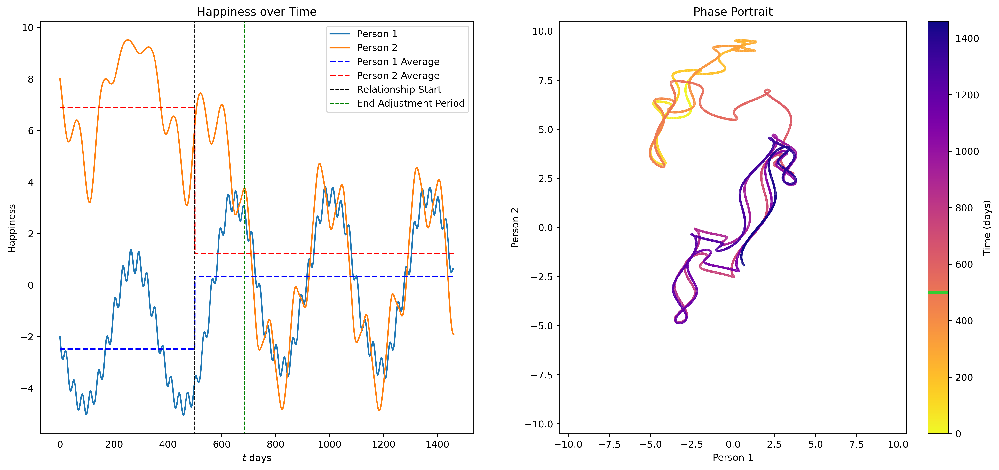

In [29]:
approx = base_model(x0=np.array([-0.2, 0.8]), gamma=np.array([0.01, 0.05]), amp=np.array([0.3, 0.6]), 
                    d=np.array([2*np.pi / 30, 2*np.pi / 90]), week_amp=np.array([.05, .2]), num_years=4, 
                    t0=500, days_adjust=183, plot_avg_lines=True, plot_event_lines=True)

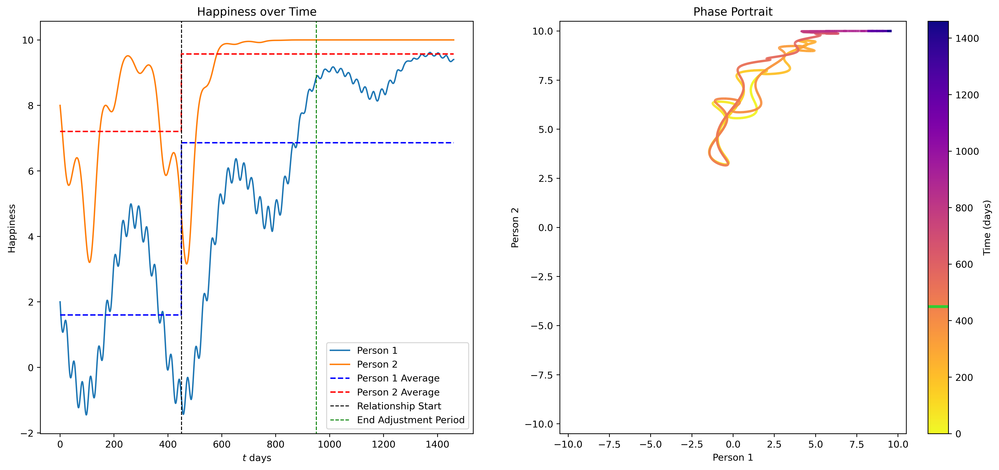

In [30]:
approx = base_model(x0=np.array([0.2, 0.8]), gamma=np.array([0.01, -0.05]), amp=np.array([0.3, 0.6]), 
                    d=np.array([2*np.pi / 30, 2*np.pi / 90]), week_amp=np.array([.05, .2]), num_years=4, t0=450, days_adjust=500)

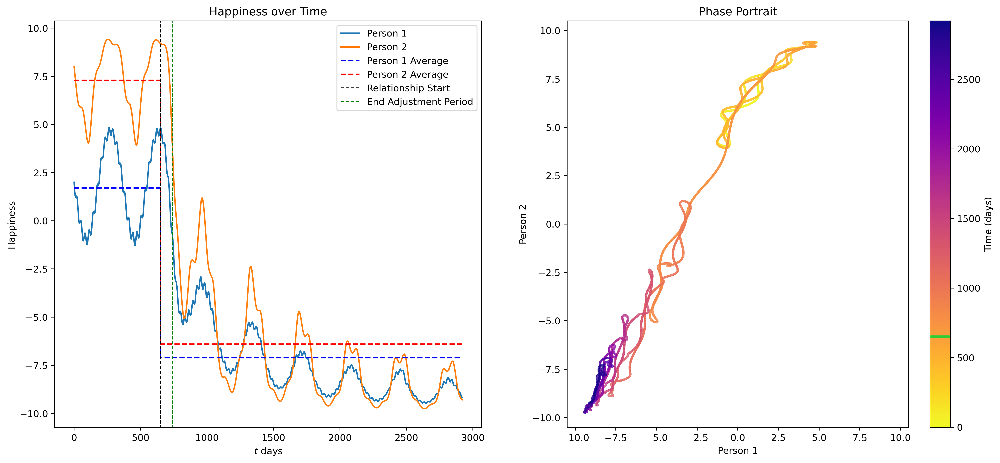

In [31]:
approx = base_model(x0=np.array([0.2, 0.8]), gamma=np.array([-0.01, 0.02]), amp=np.array([0.3, 0.6]), 
                    d=np.array([2*np.pi / 30, 2*np.pi / 90]), week_amp=np.array([0.03, 0.1]), num_years=8, t0=650)

### The Time Variant Reactive functions

In [11]:
def base_model(x0=np.array([0.5, 0.5]), gamma=np.array([0.5, 0.5]), c=np.array([2*np.pi / 365, 2*np.pi / 365]), d=np.array([2*np.pi / 7, 2*np.pi / 7]),
               amp=np.array([0, 0]), week_amp=np.array([0, 0]), t0=0, days_adjust=90, num_years=1, plot=True, plot_avg_lines=True, plot_event_lines=True):
    '''Return the approximated solution to the two-person relationship model under the following assumptions:
        1. The personal happiness of each individual is either constant or periodic.
        2. The level of reactivity of each individual is measured by a constant.
        
        Parameters:
            x0 ((1,2) ndarray) : the initial conditions, i.e. starting happiness values for each person
                - defaults to 0.5 for both people
            gamma ((1,2) array-like) : the reactivity coefficients for persons 1 and 2, respectively
                - defaults to 0.5 for both people
            c ((1, 2) array-like) : the period of individual happiness fluctuation for each person 
                - defaults to 2*np.pi / 365 (happiness fluctuates seasonally)
            amp ((1, 2) array-like) : dictates the amplitude of each person's individual happiness wave
                - defaults to (0, 0) (corresponding to constant invidiual happiness)
            d ((1, 2) array-like) : the period of individual happiness fluctuation for each person on a small-scale basis
                - defaults to 2*np.pi / 365 (happiness fluctuates seasonally)
            week_amp ((1, 2) array-like) : dictates the amplitude of each person's individual happiness wave on a small-scale basis
                - defaults to (0, 0) (corresponding to constant invidiual happiness)
            t0 (float) : the time at which persons 1 and 2 begin interacting 
                - defaults to 0 (always in relationship)
            days_adjust (int) : the number of days for both people to adjust to relationship, i.e. reach full interactivity
                - defaults to 90
            num_years (float) : the length of the time period to evaluate, in years
                - defaults to 1
            plot (bool) : whether to show solution plots in addition to returning the solution
                - defaults to True
            plot_avg_lines (bool) : whether to plot the average happiness lines on the plot
                - defaults to True
            plot_event_lines (bool) : whether to plot the relationship event vertical lines on the plot
                - defaults to True    
        
        Returns: 
            (ndarray, ndarray, ndarray) : the approximated solution to the IVP
                - includes time steps and approximated values for person 1 and person 2, in that order
    '''
    T = int(num_years * 365)
    t_span = (0, T)  
    t_vals = np.linspace(0, T, 3*T + 1) 

    # the indicator function determines whether the individuals are interacting
    ind = lambda t : int(t >= t0)
    tf = t0 + days_adjust
    
    # function that implements an adjustment period after the start of the relationship
    def _adjust(t):
        if t < t0: return 0
        elif t > tf: return 1
        else: return 1 - (tf - t) / (tf - t0)

    # define the ODE
    def base_ode(t, x):
        # personal happiness components
        H1p_dot= -1 * (amp[0] * c[0] * np.cos(c[0] * t) + week_amp[0] * d[0] * np.cos(d[0] * t))
        H2p_dot = -1 * (amp[1] * c[1] * np.cos(c[1] * t) + week_amp[1] * d[1] * np.cos(d[1] * t))

        # total happiness
        H1t_dot = H1p_dot + gamma[0](t) * (x[1] - x[0]) * ind(t) * _adjust(t)
        H2t_dot = H2p_dot + gamma[1](t) * (x[0] - x[1]) * ind(t) * _adjust(t)

        # return -- scale by 'carrying capacity' to keep solutions bounded
        return np.array([
            H1t_dot * (1 - x[0] / 1) * (1 + x[0] / 1),
            H2t_dot * (1 - x[1] / 1) * (1 + x[1] / 1)
        ])
    
    # approximate solution to IVP
    sol = solve_ivp(base_ode, t_span, x0, t_eval=t_vals)
    p1_vals = sol.y[0] * 10
    p2_vals = sol.y[1] * 10

    # plot solutions if desired
    if plot:
        # scale happiness levels to 0 - 10, like survey results
        fig1, axs = plt.subplots(nrows=1, ncols=2)
        axs[0] = plt.subplot(121)
        axs[0].plot(sol.t, p1_vals, label='Person 1')
        axs[0].plot(sol.t, p2_vals, label='Person 2')

        # plot the average lines and relationship event lines
        index = int(t0 * (3*T + 1) / T)
        if plot_avg_lines:
            axs[0].plot(sol.t, [np.mean(p1_vals[:index])] * index + [np.mean(p1_vals[index:])] * ((3*T) + 1 - index), 'b--', label="Person 1 Average")
            axs[0].plot(sol.t, [np.mean(p2_vals[:index])] * index + [np.mean(p2_vals[index:])] * ((3*T) + 1 - index), 'r--', label="Person 2 Average")
        if plot_event_lines:
            axs[0].axvline(t0, ymin=min(min(p1_vals), min(p2_vals)) - .5, ymax=max(max(p1_vals), max(p2_vals)) + .5, c='k', ls='--', lw=1, label="Relationship Start")
            axs[0].axvline(tf, ymin=min(min(p1_vals), min(p2_vals)) - .5, ymax=max(max(p1_vals), max(p2_vals)) + .5, c='g', ls='--', lw=1, label="End Adjustment Period")

        # finish the happiness plot
        axs[0].set_xlabel(r"$t$ days")
        axs[0].set_ylabel("Happiness")
        axs[0].legend()
        axs[0].set_title("Happiness over Time")

        # plot the phase portrait
        lines = colored_line(sol.y[0]*10, sol.y[1]*10, np.linspace(0, sol.t[-1], len(sol.t)+1), axs[1], linewidth=2.5, cmap="plasma_r")
        
        # add a color legend
        cbar = fig1.colorbar(lines, ax=axs[1], label='Time (days)')  
        cbar.ax.axhline(t0, c='limegreen', lw=3)
        
        # finish the phase portrait plot
        axs[1].set_xlabel("Person 1")
        axs[1].set_ylabel("Person 2")
        axs[1].set_title("Phase Portrait")
        axs[1].set_xlim([-10.5, 10.5])
        axs[1].set_ylim([-10.5, 10.5])
        plt.show()
    
    return sol.t, sol.y[0], sol.y[1]

In [ ]:
# person's reactivity increases to a certain capacity and stays
def pos_log(t):
    """Return the approximated solution to the two-person relationship model under the following assumptions:
        person happiness is distributed with logistic function 
        L is how much your reaction can varry
        s is how much of the reaction is negative
        k is steepness, rate of reaction"""
    L = 0.5
    k = 1 / 30
    s = 0.2
    g = 200
    return (L / (1 + np.exp(-k * (t - g))) - s)

In [ ]:
# person's reactivity decreases to a certain capacity and stays
def neg_log(t):
    """Return the approximated solution to the two-person relationship model under the following assumptions:
        person happiness is distributed with negative logistic function 
        L is how much your reaction can varry
        s is how much of the reaction is negative
        k is steepness, rate of reaction"""
    L = 0.5
    k = 1 / 30
    s = 0.2
    g = 200
    return (1 / 10) * (-L / (1 + np.exp(-k * (t - g))) - s)

In [ ]:
# person's reactivity is constantly varying
def pos_sin(t):
    """Return the approximated solution to the two-person relationship model under the following assumptions:
        person happiness is distributed with oscilation 
        a is applitude
        b is period"""
    a = 0.5
    b = (2 * np.pi) / 30
    return (a * np.sin(b * t))

In [ ]:
# person's reactivity is constantly varying
def neg_sin(t):
    """Return the approximated solution to the two-person relationship model under the following assumptions:
        person happiness is distributed with oscilation 
        a is applitude
        b is period"""
    a = 0.5
    b = (2 * np.pi) / 30
    return (-a * np.sin(b * t))

In [ ]:
# person's reactivity increases until a certain level of relationship comfort and then decreases
def pos_norm(t):
    """Return the approximated solution to the two-person relationship model under the following assumptions:
        person happiness is normally distrubuted
        a is mean
        b is variance
        c is amplitude
        d is offset"""
    a = 300
    b = 50
    c = 0.5
    d = 0.2
    return 125 * c *(norm.pdf(t, a, b)) + d

In [ ]:
# person's reactivity decreases until a certain level of relationship comfort and then increases
def neg_norm(t):
    """Return the approximated solution to the two-person relationship model under the following assumptions:
        person happiness is negatively normally distrubuted
        a is mean
        b is variance
        c is amplitude
        d is offset"""
    a = 300
    b = 50
    c = 0.5
    d = 0.2
    return 125 * c * (-norm.pdf(t, a, b)) + d

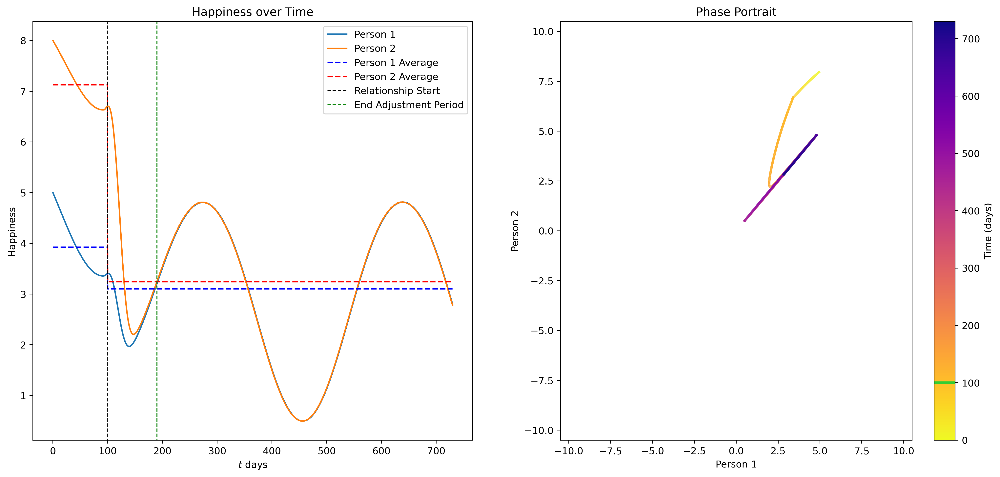

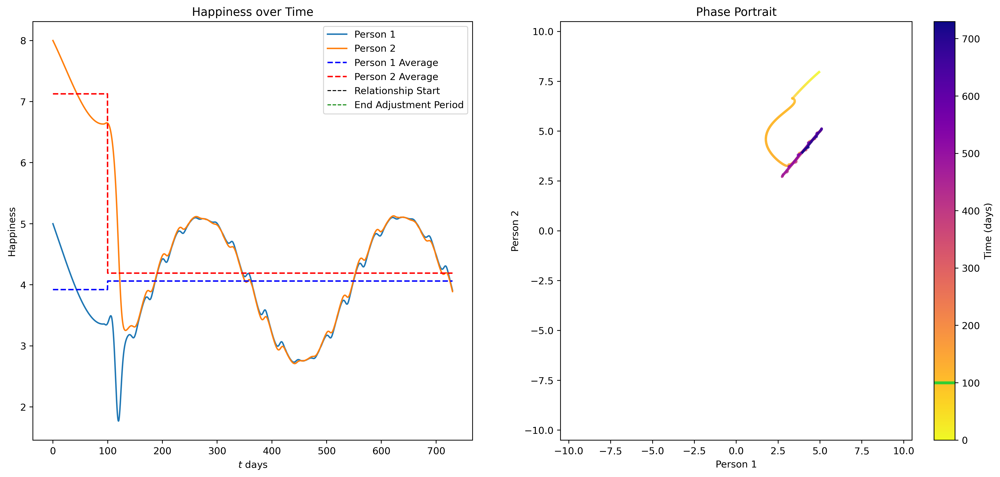

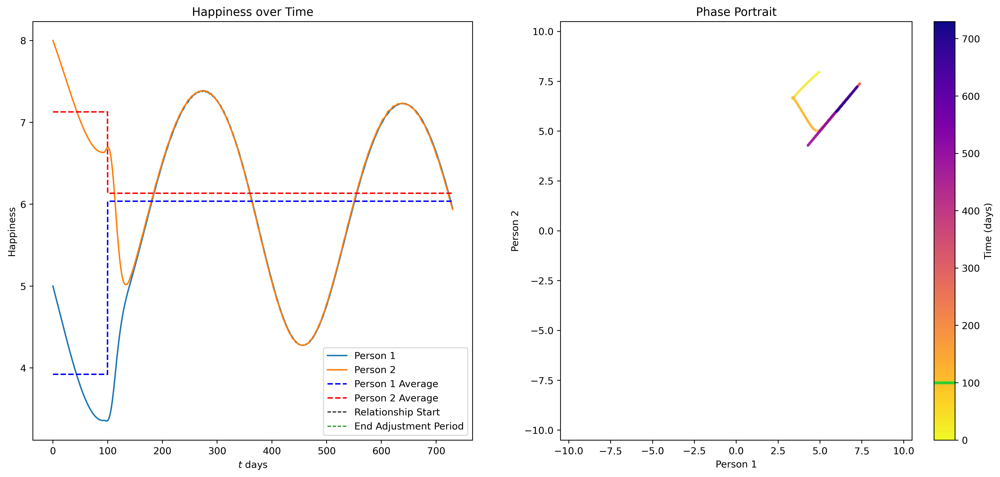

In [18]:
# plot all types of reactivity against a person with constant reactivity
approx_pos_log = base_model(x0=np.array([0.5,0.8]), gamma=(pos_log, lambda t: 0.5), amp=np.array([0.2,0.3]), t0=100, num_years=2)
approx_sin = base_model(x0=np.array([0.5,0.8]), gamma=(pos_sin, lambda t: 0.5), amp=np.array([0.2,0.3]), t0=100, num_years=2)
approx_pos_norm = base_model(x0=np.array([0.5,0.8]), gamma=(pos_norm, lambda t: 0.5), amp=np.array([0.2,0.3]), t0=100, num_years=2)

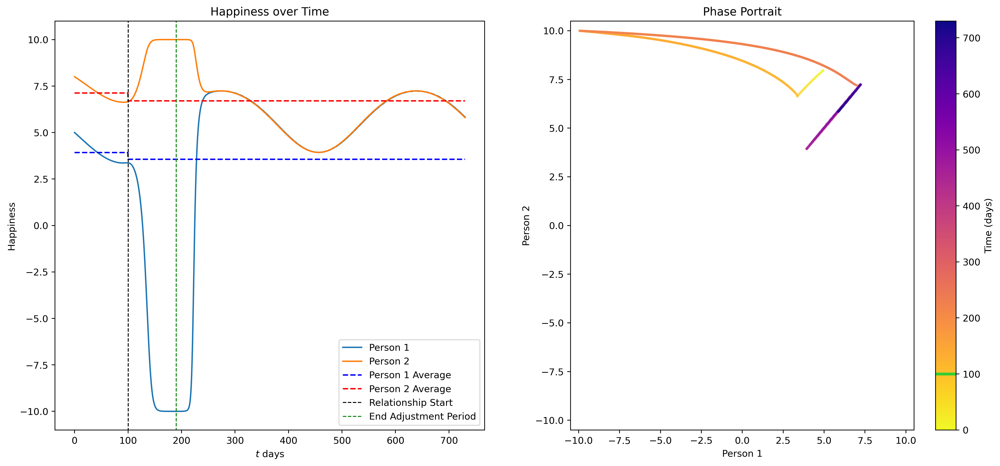

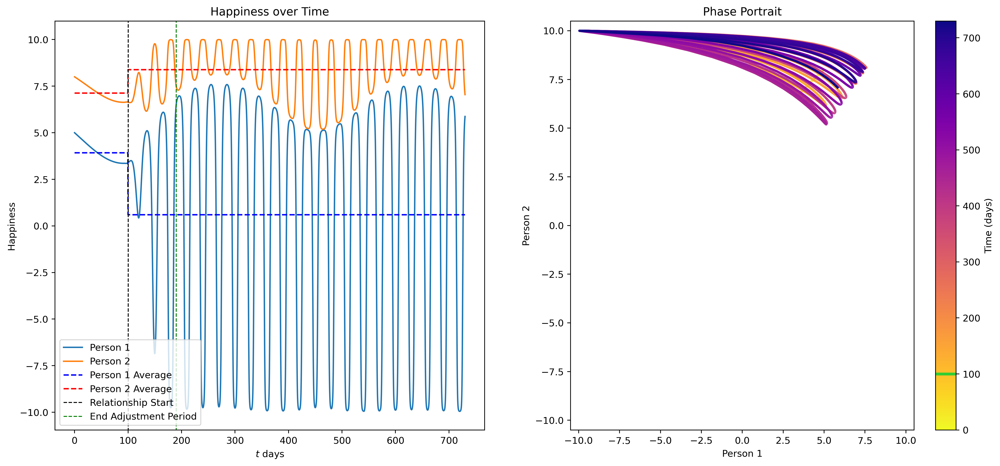

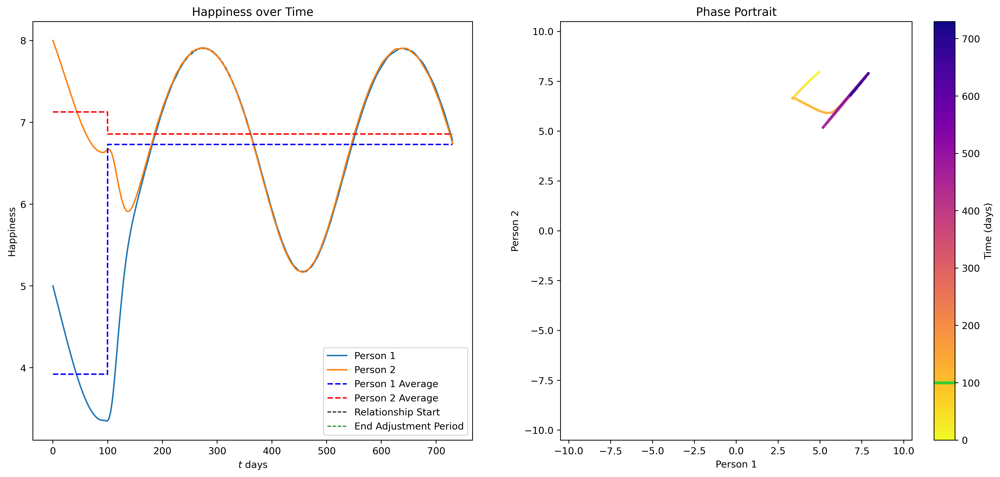

In [19]:
# plot 2 people with the same reactivity
approx_pos_log = base_model(x0=np.array([0.5,0.8]), gamma=(pos_log, pos_log), amp=np.array([0.2,0.3]), t0=100, num_years=2)
approx_sin = base_model(x0=np.array([0.5,0.8]), gamma=(pos_sin, pos_sin), amp=np.array([0.2,0.3]), t0=100, num_years=2)
approx_pos_norm = base_model(x0=np.array([0.5,0.8]), gamma=(pos_norm, pos_norm), amp=np.array([0.2,0.3]), t0=100, num_years=2)

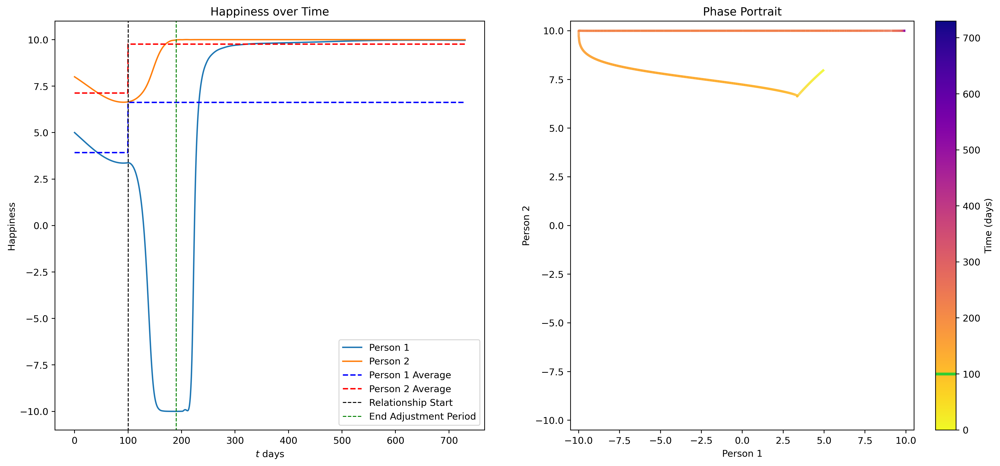

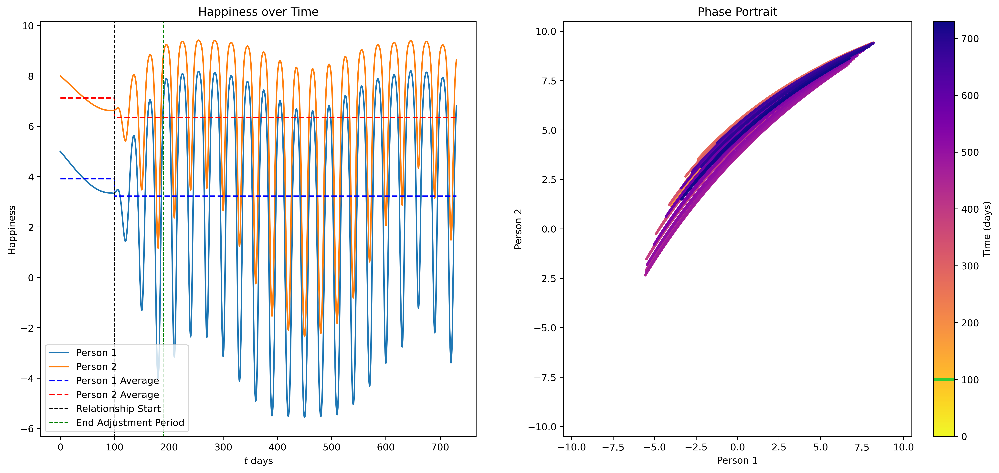

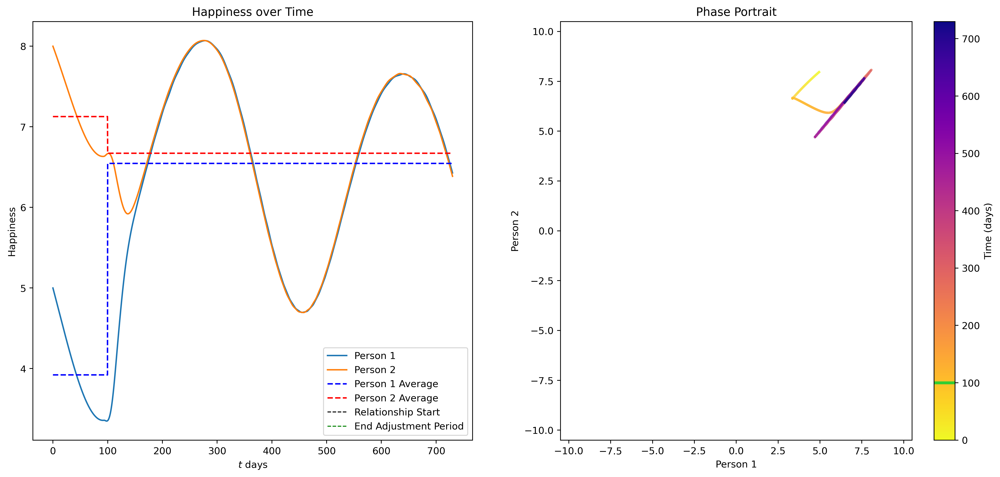

In [20]:
# plot people with exactly opposite reactivity
opposite_log = base_model(x0=np.array([0.5,0.8]), gamma=(pos_log, neg_log), amp=np.array([0.2,0.3]), t0=100, num_years=2)
opposite_sin = base_model(x0=np.array([0.5,0.8]), gamma=(pos_sin, neg_sin), amp=np.array([0.2,0.3]), t0=100, num_years=2)
opposite_norm = base_model(x0=np.array([0.5,0.8]), gamma=(pos_norm, neg_norm), amp=np.array([0.2,0.3]), t0=100, num_years=2)

In [21]:
log1 = base_model(x0=np.array([0.5,0.8]), gamma=(pos_log, lambda t: 0.5), amp=np.array([0.2,0.3]), t0=100, num_years=2, plot=False)
log2 = base_model(x0=np.array([0.5,0.8]), gamma=(pos_log, pos_log), amp=np.array([0.2,0.3]), t0=100, num_years=2, plot=False)
log3 = base_model(x0=np.array([0.5,0.8]), gamma=(pos_log, neg_log), amp=np.array([0.2,0.3]), t0=100, num_years=2, plot=False)

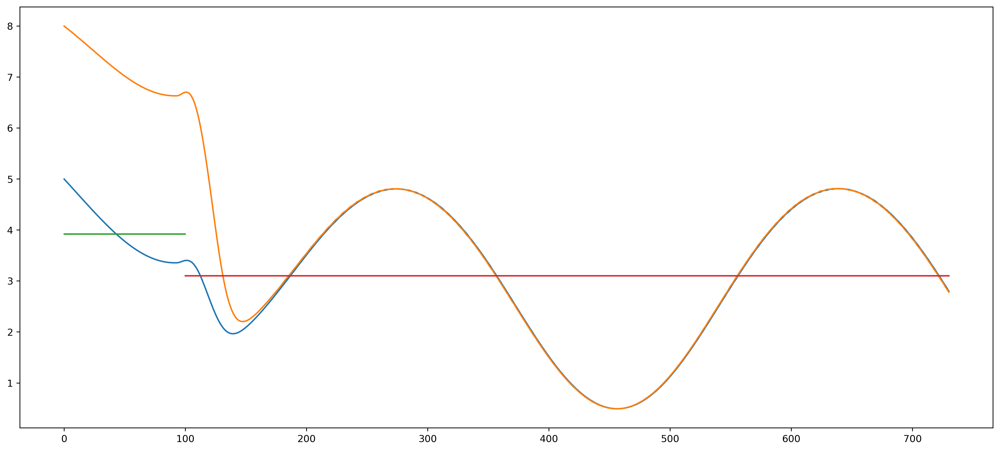

In [22]:
t, y1, y2 = log1
t0 = 100
T = t0 + 90
index = int(t0 * (3*T + 1) / T)

plt.plot(t, y1 * 10)
plt.plot(t, y2 * 10)
plt.plot(t[:index], [np.mean(y1[:index]) * 10] * index)
plt.plot(t[index:], [np.mean(y1[index:]) * 10] * (len(t) - index))
plt.show()

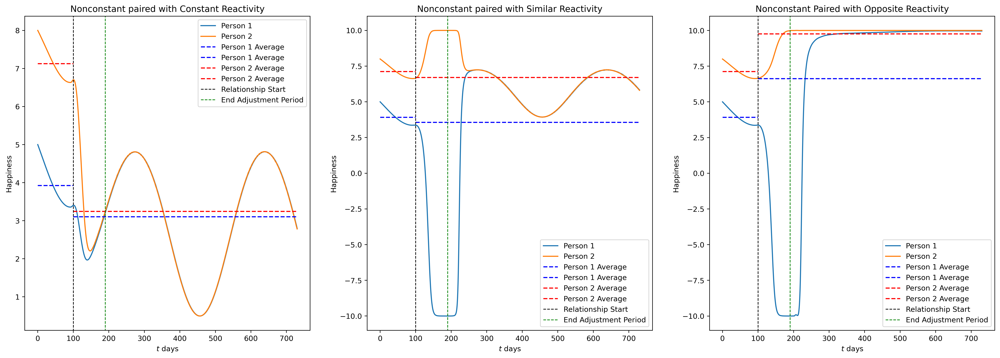

In [23]:
t0 = 100
T = t0 + 90
fig1, ax = plt.subplots(nrows=1, ncols=3)
fig1.set_figheight(8)
fig1.set_figwidth(24)

# first subplot
ax[0] = plt.subplot(131)
plt.plot(log1[0], log1[1] * 10, label="Person 1")
plt.plot(log1[0], log1[2] * 10, label="Person 2")


index = int(t0 * (3*T + 1) / T)

ax[0].plot(log1[0][:index], [np.mean(log1[1][:index] * 10)] * index, 'b--', label="Person 1 Average")
ax[0].plot(log1[0][index:], [np.mean(log1[1][index:] * 10)] * (len(log1[0]) - index), 'b--', label="Person 1 Average")
ax[0].plot(log1[0][:index], [np.mean(log1[2][:index] * 10)] * index, 'r--', label="Person 2 Average")
ax[0].plot(log1[0][index:], [np.mean(log1[2][index:] * 10)] * (len(log1[0]) - index), 'r--', label="Person 2 Average")

ax[0].axvline(t0, ymin=min(min(log1[1]), min(log1[2])) - .5, ymax=max(max(log1[1]), max(log1[2])) + .5, c='k', ls='--', lw=1, label="Relationship Start")
ax[0].axvline(T, ymin=min(min(log1[1]), min(log1[2])) - .5, ymax=max(max(log1[1]), max(log1[2])) + .5, c='g', ls='--', lw=1, label="End Adjustment Period")

ax[0].set_xlabel(r"$t$ days")
ax[0].set_ylabel("Happiness")
ax[0].legend()
ax[0].set_title("Nonconstant paired with Constant Reactivity")

# second subplot
ax[1] = plt.subplot(132)
plt.plot(log2[0], log2[1] * 10, label="Person 1")
plt.plot(log2[0], log2[2] * 10, label="Person 2")

ax[1].plot(log2[0][:index], [np.mean(log2[1][:index] * 10)] * index, 'b--', label="Person 1 Average")
ax[1].plot(log2[0][index:], [np.mean(log2[1][index:] * 10)] * (len(log2[0]) - index), 'b--', label="Person 1 Average")
ax[1].plot(log2[0][:index], [np.mean(log2[2][:index] * 10)] * index, 'r--', label="Person 2 Average")
ax[1].plot(log2[0][index:], [np.mean(log2[2][index:] * 10)] * (len(log2[0]) - index), 'r--', label="Person 2 Average")

ax[1].axvline(t0, ymin=min(min(log2[1]), min(log2[2])) - .5, ymax=max(max(log2[1]), max(log2[2])) + .5, c='k', ls='--', lw=1, label="Relationship Start")
ax[1].axvline(T, ymin=min(min(log2[1]), min(log2[2])) - .5, ymax=max(max(log2[1]), max(log2[2])) + .5, c='g', ls='--', lw=1, label="End Adjustment Period")

ax[1].set_xlabel(r"$t$ days")
ax[1].set_ylabel("Happiness")
ax[1].legend()
ax[1].set_title("Nonconstant paired with Similar Reactivity")

# third subplot
ax[2] = plt.subplot(133)
plt.plot(log3[0], log3[1] * 10, label="Person 1")
plt.plot(log3[0], log3[2] * 10, label="Person 2")

ax[2].plot(log3[0][:index], [np.mean(log3[1][:index] * 10)] * index, 'b--', label="Person 1 Average")
ax[2].plot(log3[0][index:], [np.mean(log3[1][index:] * 10)] * (len(log3[0]) - index), 'b--', label="Person 1 Average")
ax[2].plot(log3[0][:index], [np.mean(log3[2][:index] * 10)] * index, 'r--', label="Person 2 Average")
ax[2].plot(log3[0][index:], [np.mean(log3[2][index:] * 10)] * (len(log3[0]) - index), 'r--', label="Person 2 Average")

ax[2].axvline(t0, ymin=min(min(log3[1]), min(log3[2])) - .5, ymax=max(max(log3[1]), max(log3[2])) + .5, c='k', ls='--', lw=1, label="Relationship Start")
ax[2].axvline(T, ymin=min(min(log3[1]), min(log3[2])) - .5, ymax=max(max(log3[1]), max(log3[2])) + .5, c='g', ls='--', lw=1, label="End Adjustment Period")

ax[2].set_xlabel(r"$t$ days")
ax[2].set_ylabel("Happiness")
ax[2].legend()
ax[2].set_title("Nonconstant Paired with Opposite Reactivity")

plt.show()

### Group Model

In [ ]:
def generalized_model(x0=np.array([0.5, 0.5]),
                      α=np.array([0, 0]),
                      γ=np.array([[0.5, 0.5], [0.5, 0.5]]),
                      plot=True):
    '''Return the approximated solution to the two-person relationship model under the following assumptions:
        1. The personal happiness of each individual is either constant or periodic.
        2. The level of reactivity of each individual is measured by a constant.
        
        Parameters:
            x0 ((n,) ndarray) : the initial conditions, i.e. starting happiness values for each person
                - defaults to 0.5 for both people
            γ ((n,n) array-like) : the reactivity coefficients for persons 1 and 2, respectively
                - defaults to 0.5 for both people
            plot (bool) : whether to show solution plots in addition to returning the solution
        
        Returns: 
            (ndarray, ndarray, ndarray) : the approximated solution to the IVP
                - includes time steps and approximated values for person 1 and person 2, in that order
    '''
    n = x0.size
    c = 1 / 52          # assume happiness is measured on a week to week period. Can be adjusted
    tf = 125
    t_span = (0, tf)  # default time interval of 1000 days. Can be adjusted
    t_vals = np.linspace(0, tf, tf * 10)

    # define the ODE
    def base_ode(t, x):
        # total happiness
        X1, X2 = np.meshgrid(x, x)
        X = γ * (X1 - X2)

        # return -- scale by 'carrying capacity' to keep solutions bounded
        return (X.sum(axis=1) + α * np.sin(x * c)) * (1 - x**2)
    
    # approximate solution to IVP
    sol = solve_ivp(base_ode, t_span, x0, t_eval=t_vals)

    # plot solutions if desired
    if plot:
        # scale happiness levels to 0 - 10, like survey results
        for i in range(n):
            plt.plot(sol.t, sol.y[i]*10, label=f'Person {i}')
            
        plt.xlabel(r"$t$ days")
        plt.ylabel("Happiness")
        plt.legend()
        plt.title("Happiness over Time")
        plt.show()
    
    return sol.t, sol.y

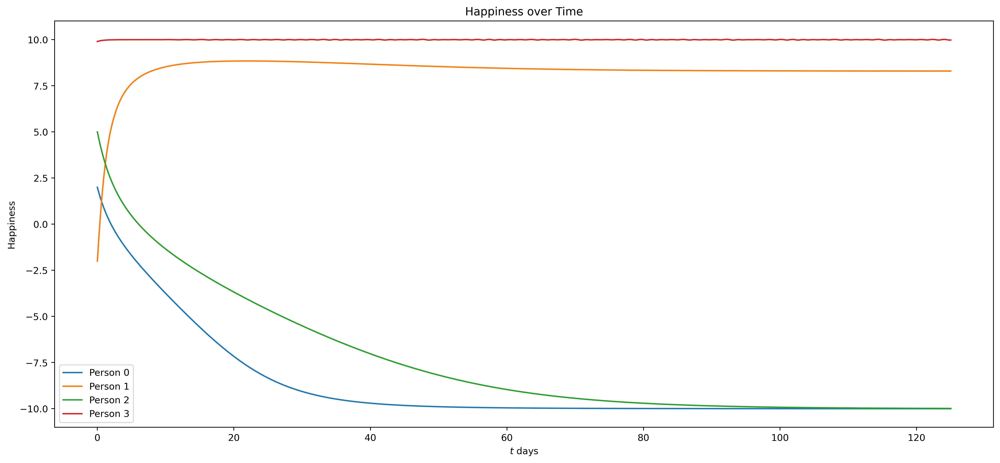

EigResult(eigenvalues=array([-0.32759977+0.j        ,  0.10124225+0.33427192j,
        0.10124225-0.33427192j,  0.12511528+0.j        ]), eigenvectors=array([[-0.4575957 +0.j        , -0.02579968+0.21019988j,
        -0.02579968-0.21019988j, -0.23758334+0.j        ],
       [ 0.59669178+0.j        , -0.70148313+0.j        ,
        -0.70148313-0.j        ,  0.55650775+0.j        ],
       [-0.56826502+0.j        ,  0.18812852+0.38044691j,
         0.18812852-0.38044691j,  0.79389507+0.j        ],
       [-0.33412568+0.j        , -0.16085231-0.50701691j,
        -0.16085231+0.50701691j,  0.05986574+0.j        ]]))

In [ ]:
x0 = np.array([0.2, -0.2, 0.5, .99])
α=np.array([0.8, 0.4, 0, 0])
γ=np.array([
    [0, .1, -0.1, -0.1],
    [0, 0, .05, .5],
    [0, 0.2, 0, -0.2],
    [-0.5, -0.2, 0, 0]
])

t, y = generalized_model(x0, α, γ)

np.linalg.eig(γ)